# Modelo de análise de sentimento para e-commerce

Este projeto tem fins exclusivamente educacionais. Estou desenvolvendo este modelo para colocar em prática os conhecimentos que venho adquirindo nos cursos que faço e, principalmente, na minha pós-graduação em Machine Learning Engineering pela FIAP.

O conjunto de dados utilizado é baseado em avaliações reais de produtos da Americanas.com, disponível publicamente na URL:
https://raw.githubusercontent.com/americanas-tech/b2w-reviews01/refs/heads/main/B2W-Reviews01.csv

A base de dados é composta pelas seguintes colunas:

* **submission_date**: Coluna do tipo data, representa a data de submissão da avaliação.

* **reviewer_id**: Coluna do tipo string, contém o ID único do cliente/avaliador.

* **product_id**: Coluna do tipo string, contém o ID único do produto avaliado.

* **product_name**: Coluna do tipo string, indica o nome do produto avaliado.

* **product_brand**: Coluna do tipo string, informa a marca do produto avaliado.

* **site_category_lv1**: Coluna do tipo string, indica a categoria principal do site onde o produto está listado.

* **site_category_lv2**: Coluna do tipo string, representa a subcategoria dentro da categoria principal.

* **review_title**: Coluna do tipo string, traz o título da avaliação feita pelo cliente.

* **overall_rating**: Coluna do tipo inteiro, representa a nota numérica dada ao produto (variando de 1 a 5 estrelas).

* **recommend_to_a_friend**: Coluna do tipo string, indica se o cliente recomendaria o produto a um amigo (sim/não).

* **review_text**: Coluna do tipo string, contém o texto completo da avaliação.

* **reviewer_birth_year**: Coluna do tipo data, traz o ano de nascimento do cliente/avaliador.

* **reviewer_gender**: Coluna do tipo string, indica o gênero do cliente/avaliador.

* **reviewer_state**: Coluna do tipo string, informa o estado brasileiro de origem do cliente.

### Importação de bibliotecas

In [4]:
# Importação das bibliotecas de carregamento e manipulação de dados

import pandas as pd
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk import tokenize
import unidecode
import joblib
from nltk.tokenize import WordPunctTokenizer
from nltk.stem import RSLPStemmer

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer


### Lendo e manipulando os dados

In [5]:
# Lendo os dados e verificando as primeiras linhas
url = 'https://raw.githubusercontent.com/americanas-tech/b2w-reviews01/refs/heads/main/B2W-Reviews01.csv'

df = pd.read_csv(url)
df.head(25)

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\379747402.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(url)


,submission_date,reviewer_id,product_id,product_name,product_brand,site_category_lv1,site_category_lv2,review_title,overall_rating,recommend_to_a_friend,review_text,reviewer_birth_year,reviewer_gender,reviewer_state
0,2018-01-01 00:11:28,d0fb1ca69422530334178f5c8624aa7a99da47907c44de...,132532965,Notebook Asus Vivobook Max X541NA-GO472T Intel...,NaN,Informática,Notebook,Bom,4,Yes,Estou contente com a compra entrega rápida o ú...,1958.0,F,RJ
1,2018-01-01 00:13:48,014d6dc5a10aed1ff1e6f349fb2b059a2d3de511c7538a...,22562178,Copo Acrílico Com Canudo 500ml Rocie,NaN,Utilidades Domésticas,"Copos, Taças e Canecas","Preço imbatível, ótima qualidade",4,Yes,"Por apenas R$1994.20,eu consegui comprar esse ...",1996.0,M,SC
2,2018-01-01 00:26:02,44f2c8edd93471926fff601274b8b2b5c4824e386ae4f2...,113022329,Panela de Pressão Elétrica Philips Walita Dail...,philips walita,Eletroportáteis,Panela Elétrica,ATENDE TODAS AS EXPECTATIVA.,4,Yes,SUPERA EM AGILIDADE E PRATICIDADE OUTRAS PANEL...,1984.0,M,SP
3,2018-01-01 00:35:54,ce741665c1764ab2d77539e18d0e4f66dde6213c9f0863...,113851581,Betoneira Columbus - Roma Brinquedos,roma jensen,Brinquedos,Veículos de Brinquedo,presente mais que desejado,4,Yes,MEU FILHO AMOU! PARECE DE VERDADE COM TANTOS D...,1985.0,F,SP
4,2018-01-01 01:00:28,7d7b6b18dda804a897359276cef0ca252f9932bf4b5c8e...,131788803,"Smart TV LED 43"" LG 43UJ6525 Ultra HD 4K com C...",lg,TV e Home Theater,TV,"Sem duvidas, excelente",5,Yes,"A entrega foi no prazo, as americanas estão de...",1994.0,M,MG
5,2018-01-01 01:27:23,28b1844e1cd24dd2288b7cafb052a0b46aed53ab28e1c1...,22562178,Copo Acrílico Com Canudo 500ml Rocie,NaN,Utilidades Domésticas,"Copos, Taças e Canecas",Produto imperdível,5,Yes,"Excelente produto, por fora em material acríli...",1979.0,M,PA
6,2018-01-01 01:54:38,48907a04d70947344017b351e8fc232bfc80dae2c33ac2...,22562178,Copo Acrílico Com Canudo 500ml Rocie,NaN,Utilidades Domésticas,"Copos, Taças e Canecas",ótimo,5,Yes,"produto mto bom, com essa garrafinha vc pode a...",NaN,NaN,NaN
7,2018-01-01 01:58:17,e039cbff059effe12756772b358af4323c2157e9561da8...,132444092,Smartphone Motorola Moto G 5S Dual Chip Androi...,NaN,Celulares e Smartphones,Smartphone,Gostei bastante do produto,4,Yes,Produto excelente qualidade boa câmera desenvo...,1987.0,M,GO
8,2018-01-01 02:02:13,a0fd1ad35b08d3b764ad6f884ef7183bf29fc7ebfcae65...,122776350,Ventilador de Teto Ventisol Fenix Premium Bran...,ventisol,Casa e Construção,Climatização,Gostei do produto,5,Yes,O barulho e minimo e o vento é bem forte na ve...,1987.0,M,SP
9,2018-01-01 02:16:06,eb1cceab541aac33c21f2c2503b8a529d07a9837f8eec7...,23474928,Kit 10 Peças Fita Led 12v 5050 300 Leds Rgb + ...,NaN,Casa e Construção,Iluminação,NÃO RECEBI O PRODUTO,1,No,MEU PRODUTO NAO FOI ENTREGUE E A AMERICANAS ES...,1984.0,M,RJ


In [6]:
# Análise exploratória

df.shape

(132373, 14)

Entendemos, aqui, que se trata de um conjunto de dados bem grande, contendo mais de 130000 linhas e 14 colunas. 
Agora, entendamos como esses dados estão distribuídos.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
overall_rating,132373.0,3.492004,1.530289,1.0,2.0,4.0,5.0,5.0
reviewer_birth_year,126389.0,1977.495898,21.895265,59.0,1969.0,1980.0,1987.0,2018.0


A coluna de data de nascimento do avaliador está sendo lida como numérica. Ao todo, possuimos apenas UMA coluna verdadeiramente numérica, a de nota.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132373 entries, 0 to 132372
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   submission_date        132373 non-null  object 
 1   reviewer_id            132373 non-null  object 
 2   product_id             132373 non-null  object 
 3   product_name           132289 non-null  object 
 4   product_brand          40982 non-null   object 
 5   site_category_lv1      132367 non-null  object 
 6   site_category_lv2      128360 non-null  object 
 7   review_title           132071 non-null  object 
 8   overall_rating         132373 non-null  int64  
 9   recommend_to_a_friend  132355 non-null  object 
 10  review_text            129098 non-null  object 
 11  reviewer_birth_year    126389 non-null  float64
 12  reviewer_gender        128237 non-null  object 
 13  reviewer_state         128382 non-null  object 
dtypes: float64(1), int64(1), object(12)


In [9]:
# Somando os valores nulos

print(df.isnull().sum())

submission_date              0
reviewer_id                  0
product_id                   0
product_name                84
product_brand            91391
site_category_lv1            6
site_category_lv2         4013
review_title               302
overall_rating               0
recommend_to_a_friend       18
review_text               3275
reviewer_birth_year       5984
reviewer_gender           4136
reviewer_state            3991
dtype: int64


In [10]:
# Definindo as colunas com as quais vou trabalhar

df.columns

Index(['submission_date', 'reviewer_id', 'product_id', 'product_name',
       'product_brand', 'site_category_lv1', 'site_category_lv2',
       'review_title', 'overall_rating', 'recommend_to_a_friend',
       'review_text', 'reviewer_birth_year', 'reviewer_gender',
       'reviewer_state'],
      dtype='object')

In [11]:
colunas_relevantes = ['product_id', 'overall_rating', 'review_text']

df = df[colunas_relevantes]
df.head()

,product_id,overall_rating,review_text
0,132532965,4,Estou contente com a compra entrega rápida o ú...
1,22562178,4,"Por apenas R$1994.20,eu consegui comprar esse ..."
2,113022329,4,SUPERA EM AGILIDADE E PRATICIDADE OUTRAS PANEL...
3,113851581,4,MEU FILHO AMOU! PARECE DE VERDADE COM TANTOS D...
4,131788803,5,"A entrega foi no prazo, as americanas estão de..."


In [12]:
# Renomeando as colunas
df_pt = df.rename(columns={
    'product_id': 'id_produto',
    'overall_rating': 'nota',
    'review_text': 'avaliacao'
})

df_pt.head()

,id_produto,nota,avaliacao
0,132532965,4,Estou contente com a compra entrega rápida o ú...
1,22562178,4,"Por apenas R$1994.20,eu consegui comprar esse ..."
2,113022329,4,SUPERA EM AGILIDADE E PRATICIDADE OUTRAS PANEL...
3,113851581,4,MEU FILHO AMOU! PARECE DE VERDADE COM TANTOS D...
4,131788803,5,"A entrega foi no prazo, as americanas estão de..."


In [13]:
# Criando a coluna target com base na coluna nota

df_pt.query('nota <= 2')

,id_produto,nota,avaliacao
9,23474928,1,MEU PRODUTO NAO FOI ENTREGUE E A AMERICANAS ES...
13,132444050,1,Esse celular não vale nada a bateria não vale ...
15,16804573,2,a mochila nao esta fechando direito por isso n...
25,125061667,1,Eu não recebi o produto e a americanas sabe di...
28,23167779,2,"Gostaria de cancelar esta compra, peço sua gen..."
...,...,...,...
132356,23307415,2,"O produto não tem uma trava para a tampa, quan..."
132364,17755845,1,"O travesseiro quando colocamos a cabeça, ele f..."
132365,132439701,1,Infelizmente o Netflix não funciona e esse era...
132371,6774907,1,"Material fraco, poderia ser melhor. Ficou deve..."


In [14]:
df_pt.query('nota >= 3')

,id_produto,nota,avaliacao
0,132532965,4,Estou contente com a compra entrega rápida o ú...
1,22562178,4,"Por apenas R$1994.20,eu consegui comprar esse ..."
2,113022329,4,SUPERA EM AGILIDADE E PRATICIDADE OUTRAS PANEL...
3,113851581,4,MEU FILHO AMOU! PARECE DE VERDADE COM TANTOS D...
4,131788803,5,"A entrega foi no prazo, as americanas estão de..."
...,...,...,...
132366,132381765,4,"A Smart TV 43"" tem ótima definição de imagem. ..."
132367,119689669,5,"Perfeito e pratico, a imagem ficou muito melho..."
132368,17962233,5,"Vale muito, estou usando no controle do Xbox e..."
132369,132631701,5,"Prático e barato, super indico o produto para ..."


Notamos que as notas acima de três são, em sua grande maioria, positivas, e as abaixo são negativas.

In [15]:
# Criando a coluna target

def define_sentimento(row):
    if row['nota'] <= 2:
        return 'negativo'
    else:
        return 'positivo'

In [16]:
df_pt['sentimento'] = df_pt.apply(define_sentimento, axis=1)
df_pt.head()

,id_produto,nota,avaliacao,sentimento
0,132532965,4,Estou contente com a compra entrega rápida o ú...,positivo
1,22562178,4,"Por apenas R$1994.20,eu consegui comprar esse ...",positivo
2,113022329,4,SUPERA EM AGILIDADE E PRATICIDADE OUTRAS PANEL...,positivo
3,113851581,4,MEU FILHO AMOU! PARECE DE VERDADE COM TANTOS D...,positivo
4,131788803,5,"A entrega foi no prazo, as americanas estão de...",positivo


In [17]:
# Verificando a quantidade de avaliações por sentimento e seu balanceamento

df_pt.value_counts('sentimento')

sentimento
positivo    96615
negativo    35758
Name: count, dtype: int64

A base de dados está bem pouco baanceada, contendo quase o triplo de avaliações positivas com relação às negativas.

In [18]:
from sklearn.utils import resample

# Separar as classes
df_pos = df_pt[df_pt['sentimento'] == 'positivo']
df_neg = df_pt[df_pt['sentimento'] == 'negativo']

# Reduzir os positivos
df_pos_downsampled = resample(df_pos,
                              replace=False,
                              n_samples=len(df_neg),
                              random_state=42)

# Juntar tudo
df_balanced = pd.concat([df_pos_downsampled, df_neg])


In [19]:
df_balanced.value_counts('sentimento')

sentimento
negativo    35758
positivo    35758
Name: count, dtype: int64

In [20]:
# Verificando valores nulos

print(df_balanced.isnull().sum())

id_produto       0
nota             0
avaliacao     2478
sentimento       0
dtype: int64


In [21]:
# Limpando o df
 
df_cleaned = df_balanced.dropna()
df_cleaned.head()

,id_produto,nota,avaliacao,sentimento
54249,6866526,5,"excelente produto , agradável , envolvente , d...",positivo
99895,8323607,5,Muito prática e fácil de usar! Pra quem ama ca...,positivo
79226,19517177,3,O produto veio na quantidade anunciada e com v...,positivo
6121,15179314,4,Nada a declarar recebi o produto de forma exce...,positivo
120390,26617975,3,Comprei é se produto mais ele n carrega aloja ...,positivo


In [22]:
print(df_cleaned.isnull().sum())

id_produto    0
nota          0
avaliacao     0
sentimento    0
dtype: int64


In [24]:
# Vetorizando
vetorizar = CountVectorizer(lowercase=False)
bag_of_words = vetorizar.fit_transform(df_cleaned.avaliacao)
print(bag_of_words.shape)

(69038, 51520)


In [25]:
# Criando uma matriz esparsa das palavras

matriz_esparsa_avaliacoes = pd.DataFrame.sparse.from_spmatrix(bag_of_words, columns=vetorizar.get_feature_names_out())
matriz_esparsa_avaliacoes.head()

,00,000,00000,000000,0000000,00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000K,0001,000KM,000Mah,000km,...,úteias,úteis,útil,útima,Ėssa,ļoja,ŕrrrrrrrrrrrrrrrrrrrrenfiahhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh,ㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤ,ㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤ,ㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤㅤ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [26]:
# Verificando todas as palavras na avaliação

todas_palavras = [texto for texto in df_cleaned.avaliacao]
todas_palavras

['excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.',
 'Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!',
 'O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.',
 'Nada a declarar recebi o produto de forma excelente.',
 'Comprei é se produto mais ele n carrega aloja ainda n resolveu o problema é tá aqui parado ja tem dias',
 'Um dos melhores cds da cantora, muito bem trabalhado e voz afinadíssima.',
 'Produto de  ótima qualidade, cobre muito bem o colchão. Excelente.',
 'Produto bom. Apenas o atraso no envio que prejudicou',
 'Excelente custo/benefício, promete o que entrega no gadget   !!!!',
 'otimo produto,desempenha bem as funçoes para que foi programado,recomendo',
 'Incrivelmente essa máquina de telefonia móvel fica mais de 10 dias sem necessidade de recarregar, com dados móveis ligados o tempo todo! Sinal sempre perfeito, aplicativ

In [27]:
# Fazendo a junção destas palavras

todas_palavras = ' '.join(texto for texto in df_cleaned.avaliacao)
todas_palavras

'excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação. Muito prática e fácil de usar! Pra quem ama café, é tudo de bom! O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas. Nada a declarar recebi o produto de forma excelente. Comprei é se produto mais ele n carrega aloja ainda n resolveu o problema é tá aqui parado ja tem dias Um dos melhores cds da cantora, muito bem trabalhado e voz afinadíssima. Produto de  ótima qualidade, cobre muito bem o colchão. Excelente. Produto bom. Apenas o atraso no envio que prejudicou Excelente custo/benefício, promete o que entrega no gadget   !!!! otimo produto,desempenha bem as funçoes para que foi programado,recomendo Incrivelmente essa máquina de telefonia móvel fica mais de 10 dias sem necessidade de recarregar, com dados móveis ligados o tempo todo! Sinal sempre perfeito, aplicativos ótimos, sem dúvida uma dadiva dos celu

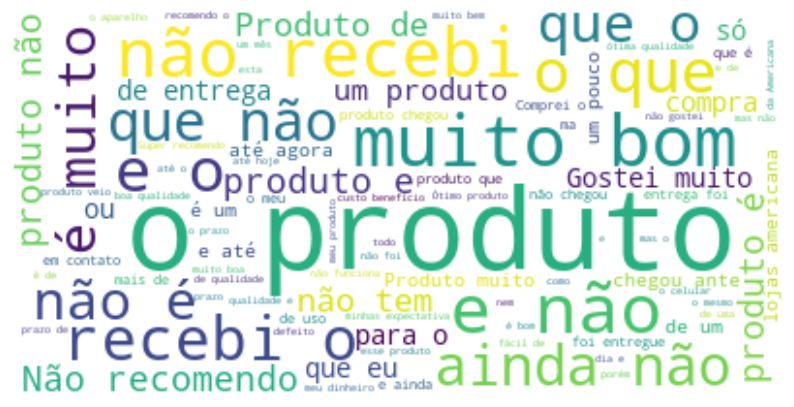

In [28]:
# Criando a nuvem de palavras para entender a distribuição das palavras nos comentários

nuvem_palavras = WordCloud(background_color='white').generate(todas_palavras)

# Criando imagem
plt.figure(figsize=(10,10))
plt.imshow(nuvem_palavras, interpolation='bilinear')
plt.axis('off')
plt.show()

In [29]:
# Criando função para a geração de nuvem de palavras

def nuvem_palavras(texto, coluna_texto, sentimento):
  # Filtrando as resenhas com base no sentimento especificado
  texto_sentimento = texto.query(f"sentimento == '{sentimento}'")[coluna_texto]

  # Unindo todas as resenhas em uma única string
  texto_unido = ' '.join(texto_sentimento)

  # Criando e exibindo a nuvem de palavras
  nuvem_palavras = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(texto_unido)
  plt.figure(figsize=(10,7))
  plt.imshow(nuvem_palavras, interpolation='bilinear')
  plt.axis('off')
  plt.show()

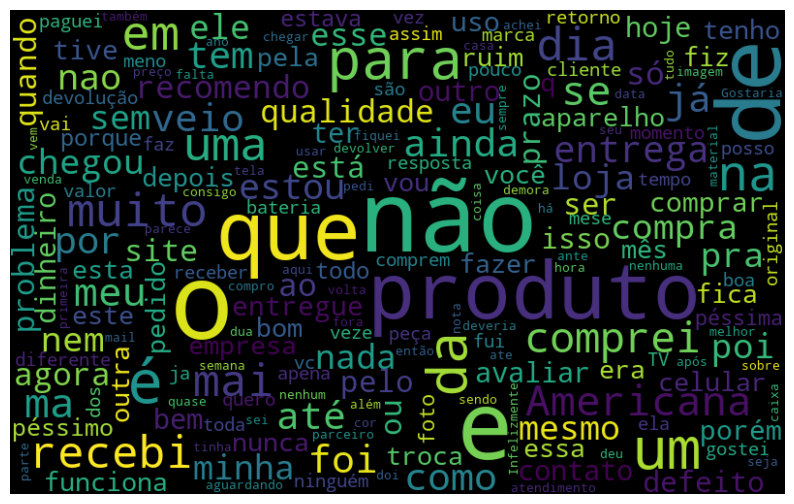

In [30]:
# Verificando as avaliações negativas
nuvem_palavras(df_cleaned, 'avaliacao', 'negativo')

Temos, com as avaliações negativas, que a palavra **PRODUTO** acaba sendo a mais comentada. Temos também, chamando a atenção na nuvem de palavras, **QUALIDADE**, **PROBLEMA** e **DINHEIRO**, por exemplo.

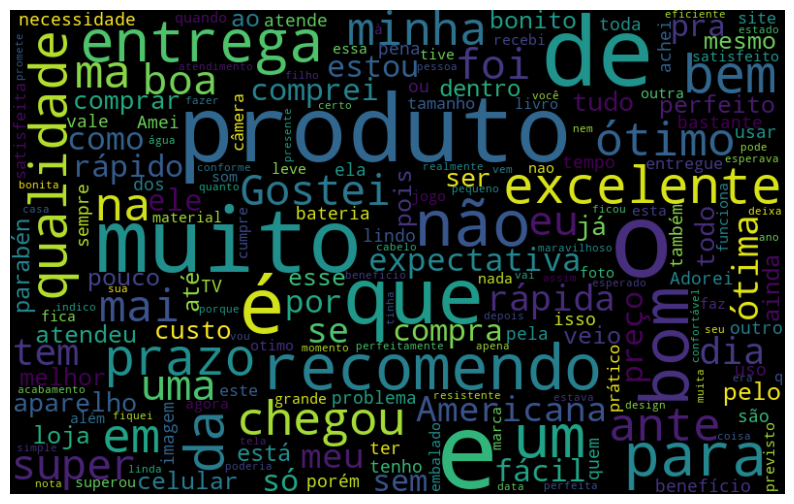

In [31]:
# Verificando as avaliações positivas
nuvem_palavras(df_cleaned, 'avaliacao', 'positivo')

Quase que como uma fotografia da nuvem anterior, temos para as avaliações positivas **PRODUTO**, **EXCELENTE**, **QUALIDADE** e **RECOMENDO**. Isso nos mostra que os produtos do e-commerce estão, em sua grande maioria, agradando aos clientes com relação à sua qualidade excelente, existindo grande probabilidade de recomendação à familiares e amigos. 

In [32]:
# Obtendo um numero para cada palavra - definindo um peso

nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\maria\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\maria\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\maria\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     C:\Users\maria\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\maria\AppData\Roaming\nltk_data...
[

True

In [33]:
# Criando tokens ao separar as palavras por espaço

tokens = tokenize.WhitespaceTokenizer()
token_frase = tokens.tokenize(todas_palavras)
frequencia = nltk.FreqDist(token_frase)

In [34]:
df_frequencia = pd.DataFrame({'palavra': list(frequencia.keys()), 'frequencia': list(frequencia.values())})
df_frequencia.head()

,palavra,frequencia
0,excelente,2308
1,produto,23224
2,",",4117
3,agradável,43
4,envolvente,13


In [35]:
# Verificando com mais atenção quais são as palavras que mais ocorrem

df_frequencia.nlargest(columns='frequencia', n=10)

,palavra,frequencia
9,e,55436
48,o,52763
7,de,48586
14,a,44347
89,que,37193
137,não,35735
1,produto,23224
37,com,22971
29,é,22966
302,do,22098


Entendemos aqui que as stopwords estão interferindo negativamente na nossa análise. 

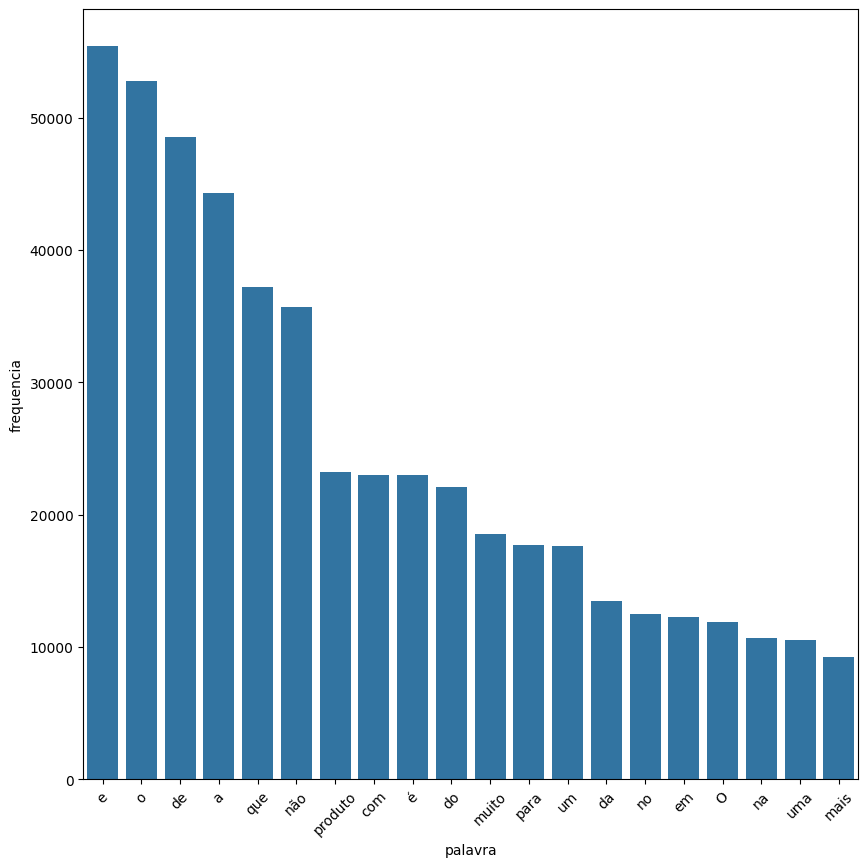

In [37]:
# Criando um grafico de barras que mostra as 10 palavras mais frequentes
import seaborn as sns

plt.figure(figsize=(10,10))
sns.barplot(x='palavra', y='frequencia', data=df_frequencia.nlargest(columns='frequencia', n=20))
plt.xticks(rotation=45)
plt.show()

In [38]:
# Função para criação de gráficos

def grafico_frequencia(texto, coluna_texto, quantidade):
    todas_palavras = ' '.join([texto for texto in texto[coluna_texto]])
    token_espaco = tokenize.WhitespaceTokenizer()
    frequencia = nltk.FreqDist(token_espaco.tokenize(todas_palavras))
    df_frequencia = pd.DataFrame({"Palavra": list(frequencia.keys()), "Frequência": list(frequencia.values())})
    df_frequencia = df_frequencia.nlargest(columns="Frequência", n=quantidade)
    plt.figure(figsize=(20,6))
    ax = sns.barplot(data=df_frequencia, x="Palavra", y ="Frequência", color='gray')
    ax.set(ylabel="Contagem")
    plt.show()

In [43]:
# Criando o modelo e calculando a eficácia e encapsulando em uma função

def classificar_texto(texto, coluna_texto, coluna_classificacao):
  vetorizar = CountVectorizer(lowercase=False, max_features=50)
  bag_of_words = vetorizar.fit_transform(texto[coluna_texto])

  x_treino, x_teste, y_treino, y_teste = train_test_split(bag_of_words, texto[coluna_classificacao], random_state=42)

  r_logistica = LogisticRegression(max_iter=1000)
  r_logistica.fit(x_treino, y_treino)

  acuracia = r_logistica.score(x_teste, y_teste)

  return print(f'Acurácia: {acuracia * 100:.2f}%')

In [39]:
# Removendo as stopwords

palavras_irrelevantes = nltk.corpus.stopwords.words('portuguese')
palavras_irrelevantes

['a',
 'à',
 'ao',
 'aos',
 'aquela',
 'aquelas',
 'aquele',
 'aqueles',
 'aquilo',
 'as',
 'às',
 'até',
 'com',
 'como',
 'da',
 'das',
 'de',
 'dela',
 'delas',
 'dele',
 'deles',
 'depois',
 'do',
 'dos',
 'e',
 'é',
 'ela',
 'elas',
 'ele',
 'eles',
 'em',
 'entre',
 'era',
 'eram',
 'éramos',
 'essa',
 'essas',
 'esse',
 'esses',
 'esta',
 'está',
 'estamos',
 'estão',
 'estar',
 'estas',
 'estava',
 'estavam',
 'estávamos',
 'este',
 'esteja',
 'estejam',
 'estejamos',
 'estes',
 'esteve',
 'estive',
 'estivemos',
 'estiver',
 'estivera',
 'estiveram',
 'estivéramos',
 'estiverem',
 'estivermos',
 'estivesse',
 'estivessem',
 'estivéssemos',
 'estou',
 'eu',
 'foi',
 'fomos',
 'for',
 'fora',
 'foram',
 'fôramos',
 'forem',
 'formos',
 'fosse',
 'fossem',
 'fôssemos',
 'fui',
 'há',
 'haja',
 'hajam',
 'hajamos',
 'hão',
 'havemos',
 'haver',
 'hei',
 'houve',
 'houvemos',
 'houver',
 'houvera',
 'houverá',
 'houveram',
 'houvéramos',
 'houverão',
 'houverei',
 'houverem',
 'hou

In [40]:
# Filtrando as palavras sem as irrelevantes

frase_processada = []

for opiniao in df_cleaned.avaliacao:
  palavras = tokens.tokenize(opiniao)
  nova_frase = [palavra for palavra in palavras if palavra not in palavras_irrelevantes]
  frase_processada.append(' '.join(nova_frase))

df_cleaned['tratamento_1'] = frase_processada

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\3046107128.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_1'] = frase_processada


In [41]:
df_cleaned.head()

,id_produto,nota,avaliacao,sentimento,tratamento_1
54249,6866526,5,"excelente produto , agradável , envolvente , d...",positivo,"excelente produto , agradável , envolvente , d..."
99895,8323607,5,Muito prática e fácil de usar! Pra quem ama ca...,positivo,"Muito prática fácil usar! Pra ama café, tudo bom!"
79226,19517177,3,O produto veio na quantidade anunciada e com v...,positivo,O produto veio quantidade anunciada validade s...
6121,15179314,4,Nada a declarar recebi o produto de forma exce...,positivo,Nada declarar recebi produto forma excelente.
120390,26617975,3,Comprei é se produto mais ele n carrega aloja ...,positivo,Comprei produto n carrega aloja ainda n resolv...


In [42]:
# Comparando a avaliação original e a transformação 1
for index, row in df_cleaned.head().iterrows():
    print(f"Avaliação original: {row['avaliacao']}")
    print(f"Transformação 1: {row['tratamento_1']}")
    print("-" * 30)


Avaliação original: excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.
Transformação 1: excelente produto , agradável , envolvente , divertido , repleto ação comparação onde vale pena assistir cada minuto dessa animação.
------------------------------
Avaliação original: Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!
Transformação 1: Muito prática fácil usar! Pra ama café, tudo bom!
------------------------------
Avaliação original: O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.
Transformação 1: O produto veio quantidade anunciada validade suficiente usar três caixas.
------------------------------
Avaliação original: Nada a declarar recebi o produto de forma excelente.
Transformação 1: Nada declarar recebi produto forma excelente.
------------------------------
Avaliação original: Comprei é se produto mais ele n carrega aloja ainda 

In [44]:
classificar_texto(df_cleaned, 'tratamento_1', 'sentimento')

Acurácia: 78.93%


In [45]:
# Tratando a pontuação

token_pontuacao = tokenize.WordPunctTokenizer()

frase_processada = []

for opiniao in df_cleaned['tratamento_1']:
  palavras = token_pontuacao.tokenize(opiniao)
  nova_frase = [palavra for palavra in palavras if palavra.isalpha() and palavra not in palavras_irrelevantes]
  frase_processada.append(' '.join(nova_frase))

df_cleaned['tratamento_2'] = frase_processada

df_cleaned.head()

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\2867464073.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_2'] = frase_processada


,id_produto,nota,avaliacao,sentimento,tratamento_1,tratamento_2
54249,6866526,5,"excelente produto , agradável , envolvente , d...",positivo,"excelente produto , agradável , envolvente , d...",excelente produto agradável envolvente diverti...
99895,8323607,5,Muito prática e fácil de usar! Pra quem ama ca...,positivo,"Muito prática fácil usar! Pra ama café, tudo bom!",Muito prática fácil usar Pra ama café tudo bom
79226,19517177,3,O produto veio na quantidade anunciada e com v...,positivo,O produto veio quantidade anunciada validade s...,O produto veio quantidade anunciada validade s...
6121,15179314,4,Nada a declarar recebi o produto de forma exce...,positivo,Nada declarar recebi produto forma excelente.,Nada declarar recebi produto forma excelente
120390,26617975,3,Comprei é se produto mais ele n carrega aloja ...,positivo,Comprei produto n carrega aloja ainda n resolv...,Comprei produto n carrega aloja ainda n resolv...


In [46]:
# Comparando a avaliação original e a transformação 1
for index, row in df_cleaned.head().iterrows():
    print(f"Avaliação original: {row['avaliacao']}")
    print(f"Transformação 2: {row['tratamento_2']}")
    print("-" * 30)


Avaliação original: excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.
Transformação 2: excelente produto agradável envolvente divertido repleto ação comparação onde vale pena assistir cada minuto dessa animação
------------------------------
Avaliação original: Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!
Transformação 2: Muito prática fácil usar Pra ama café tudo bom
------------------------------
Avaliação original: O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.
Transformação 2: O produto veio quantidade anunciada validade suficiente usar três caixas
------------------------------
Avaliação original: Nada a declarar recebi o produto de forma excelente.
Transformação 2: Nada declarar recebi produto forma excelente
------------------------------
Avaliação original: Comprei é se produto mais ele n carrega aloja ainda n resolveu o p

In [47]:
classificar_texto(df_cleaned, 'tratamento_2', 'sentimento')

Acurácia: 78.93%


In [48]:
# Removendo a acentuação

sem_acento = [unidecode.unidecode(texto) for texto in df_cleaned['tratamento_2']]

df_cleaned['tratamento_3'] = sem_acento

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\1750800263.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_3'] = sem_acento


In [49]:
# tratando as stopwords tambem

stopwords_sem_acento = [unidecode.unidecode(texto) for texto in palavras_irrelevantes]

In [50]:
# criando coluna para tratamento 3

frase_processada = []

for opiniao in df_cleaned['tratamento_3']:
  palavras = token_pontuacao.tokenize(opiniao)
  nova_frase = [palavra for palavra in palavras if palavra.isalpha() and palavra not in stopwords_sem_acento]
  frase_processada.append(' '.join(nova_frase))

df_cleaned['tratamento_3'] = frase_processada

df_cleaned.head(10)

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\3209672395.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_3'] = frase_processada


,id_produto,nota,avaliacao,sentimento,tratamento_1,tratamento_2,tratamento_3
54249,6866526,5,"excelente produto , agradável , envolvente , d...",positivo,"excelente produto , agradável , envolvente , d...",excelente produto agradável envolvente diverti...,excelente produto agradavel envolvente diverti...
99895,8323607,5,Muito prática e fácil de usar! Pra quem ama ca...,positivo,"Muito prática fácil usar! Pra ama café, tudo bom!",Muito prática fácil usar Pra ama café tudo bom,Muito pratica facil usar Pra ama cafe tudo bom
79226,19517177,3,O produto veio na quantidade anunciada e com v...,positivo,O produto veio quantidade anunciada validade s...,O produto veio quantidade anunciada validade s...,O produto veio quantidade anunciada validade s...
6121,15179314,4,Nada a declarar recebi o produto de forma exce...,positivo,Nada declarar recebi produto forma excelente.,Nada declarar recebi produto forma excelente,Nada declarar recebi produto forma excelente
120390,26617975,3,Comprei é se produto mais ele n carrega aloja ...,positivo,Comprei produto n carrega aloja ainda n resolv...,Comprei produto n carrega aloja ainda n resolv...,Comprei produto n carrega aloja ainda n resolv...
110034,32083888,5,"Um dos melhores cds da cantora, muito bem trab...",positivo,"Um melhores cds cantora, bem trabalhado voz af...",Um melhores cds cantora bem trabalhado voz afi...,Um melhores cds cantora bem trabalhado voz afi...
46500,29193649,5,"Produto de ótima qualidade, cobre muito bem o...",positivo,"Produto ótima qualidade, cobre bem colchão. Ex...",Produto ótima qualidade cobre bem colchão Exce...,Produto otima qualidade cobre bem colchao Exce...
74216,110357271,4,Produto bom. Apenas o atraso no envio que prej...,positivo,Produto bom. Apenas atraso envio prejudicou,Produto bom Apenas atraso envio prejudicou,Produto bom Apenas atraso envio prejudicou
77959,31390845,4,"Excelente custo/benefício, promete o que entre...",positivo,"Excelente custo/benefício, promete entrega gad...",Excelente custo benefício promete entrega gadget,Excelente custo beneficio promete entrega gadget
82091,30230658,5,"otimo produto,desempenha bem as funçoes para q...",positivo,"otimo produto,desempenha bem funçoes programad...",otimo produto desempenha bem funçoes programad...,otimo produto desempenha bem funcoes programad...


In [51]:
# Comparando a avaliação original e a transformação 1
for index, row in df_cleaned.head().iterrows():
    print(f"Avaliação original: {row['avaliacao']}")
    print(f"Transformação 3: {row['tratamento_3']}")
    print("-" * 30)


Avaliação original: excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.
Transformação 3: excelente produto agradavel envolvente divertido repleto acao comparacao onde vale pena assistir cada minuto dessa animacao
------------------------------
Avaliação original: Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!
Transformação 3: Muito pratica facil usar Pra ama cafe tudo bom
------------------------------
Avaliação original: O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.
Transformação 3: O produto veio quantidade anunciada validade suficiente usar tres caixas
------------------------------
Avaliação original: Nada a declarar recebi o produto de forma excelente.
Transformação 3: Nada declarar recebi produto forma excelente
------------------------------
Avaliação original: Comprei é se produto mais ele n carrega aloja ainda n resolveu o p

In [52]:
classificar_texto(df_cleaned, 'tratamento_3', 'sentimento')

Acurácia: 79.50%


In [53]:
# Uniformizando o texto

df_cleaned['tratamento_4'] = df_cleaned['tratamento_3'].str.lower()

frase_processada = []

for opiniao in df_cleaned['tratamento_4']:
  palavras = token_pontuacao.tokenize(opiniao)
  nova_frase = [palavra for palavra in palavras if palavra.isalpha() and palavra not in stopwords_sem_acento]
  frase_processada.append(' '.join(nova_frase))

df_cleaned['tratamento_4'] = frase_processada

# grafico_frequencia(df_cleaned, 'tratamento_4', 20)

df_cleaned.head()

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\1271960595.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_4'] = df_cleaned['tratamento_3'].str.lower()
C:\Users\maria\AppData\Local\Temp\ipykernel_1340\1271960595.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_4'] = frase_processada


,id_produto,nota,avaliacao,sentimento,tratamento_1,tratamento_2,tratamento_3,tratamento_4
54249,6866526,5,"excelente produto , agradável , envolvente , d...",positivo,"excelente produto , agradável , envolvente , d...",excelente produto agradável envolvente diverti...,excelente produto agradavel envolvente diverti...,excelente produto agradavel envolvente diverti...
99895,8323607,5,Muito prática e fácil de usar! Pra quem ama ca...,positivo,"Muito prática fácil usar! Pra ama café, tudo bom!",Muito prática fácil usar Pra ama café tudo bom,Muito pratica facil usar Pra ama cafe tudo bom,pratica facil usar pra ama cafe tudo bom
79226,19517177,3,O produto veio na quantidade anunciada e com v...,positivo,O produto veio quantidade anunciada validade s...,O produto veio quantidade anunciada validade s...,O produto veio quantidade anunciada validade s...,produto veio quantidade anunciada validade suf...
6121,15179314,4,Nada a declarar recebi o produto de forma exce...,positivo,Nada declarar recebi produto forma excelente.,Nada declarar recebi produto forma excelente,Nada declarar recebi produto forma excelente,nada declarar recebi produto forma excelente
120390,26617975,3,Comprei é se produto mais ele n carrega aloja ...,positivo,Comprei produto n carrega aloja ainda n resolv...,Comprei produto n carrega aloja ainda n resolv...,Comprei produto n carrega aloja ainda n resolv...,comprei produto n carrega aloja ainda n resolv...


In [54]:
# Comparando a avaliação original e a transformação 1
for index, row in df_cleaned.head().iterrows():
    print(f"Avaliação original: {row['avaliacao']}")
    print(f"Transformação 4: {row['tratamento_4']}")
    print("-" * 30)


Avaliação original: excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.
Transformação 4: excelente produto agradavel envolvente divertido repleto acao comparacao onde vale pena assistir cada minuto dessa animacao
------------------------------
Avaliação original: Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!
Transformação 4: pratica facil usar pra ama cafe tudo bom
------------------------------
Avaliação original: O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.
Transformação 4: produto veio quantidade anunciada validade suficiente usar tres caixas
------------------------------
Avaliação original: Nada a declarar recebi o produto de forma excelente.
Transformação 4: nada declarar recebi produto forma excelente
------------------------------
Avaliação original: Comprei é se produto mais ele n carrega aloja ainda n resolveu o problema 

In [55]:
classificar_texto(df_cleaned, 'tratamento_4', 'sentimento')

Acurácia: 81.13%


In [56]:
# Simplificando o corpus de palavras

stemmer = nltk.RSLPStemmer()

frase_processada = []

for opiniao in df_cleaned['tratamento_4']:
  palavras = token_pontuacao.tokenize(opiniao)
  nova_frase = [stemmer.stem(palavra) for palavra in palavras if palavra.isalpha() and palavra not in stopwords_sem_acento]
  frase_processada.append(' '.join(nova_frase))

df_cleaned['tratamento_5'] = frase_processada

C:\Users\maria\AppData\Local\Temp\ipykernel_1340\2396988248.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['tratamento_5'] = frase_processada


In [57]:
# Comparando a avaliação original e a transformação 1
for index, row in df_cleaned.head().iterrows():
    print(f"Avaliação original: {row['avaliacao']}")
    print(f"Transformação 5: {row['tratamento_5']}")
    print("-" * 30)


Avaliação original: excelente produto , agradável , envolvente , divertido , repleto de ação e sem comparação onde vale a pena assistir cada minuto dessa animação.
Transformação 5: excel produt agrada envolv divert replet aca comparaca ond val pen assist cad minut dess animaca
------------------------------
Avaliação original: Muito prática e fácil de usar! Pra quem ama café, é tudo de bom!
Transformação 5: pra facil us pra ama caf tud bom
------------------------------
Avaliação original: O produto veio na quantidade anunciada e com validade suficiente para usar as três caixas.
Transformação 5: produt vei quant anunci validad sufici us tre caix
------------------------------
Avaliação original: Nada a declarar recebi o produto de forma excelente.
Transformação 5: nad declar receb produt form excel
------------------------------
Avaliação original: Comprei é se produto mais ele n carrega aloja ainda n resolveu o problema é tá aqui parado ja tem dias
Transformação 5: compr produt n carr

In [58]:
classificar_texto(df_cleaned, 'tratamento_5', 'sentimento')

Acurácia: 82.64%


### Treinando o Modelo

In [59]:
# Entendendo a relevância das palavras

from sklearn.feature_extraction.text import TfidfVectorizer

In [60]:
tfidf = TfidfVectorizer(lowercase=False, max_features=50)
matriz = tfidf.fit_transform(df_cleaned['tratamento_5'])

pd.DataFrame(matriz.todense(), columns=tfidf.get_feature_names_out())

,ach,agor,aind,americ,ant,aparelh,atend,bem,boa,bom,...,recom,sit,sup,ter,tod,troc,uso,val,vei,vend
0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.719579,0.000000,0.0
1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.348699,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
2,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.896088,0.0
3,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
4,0.0,0.0,0.508662,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69033,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
69034,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.613771,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
69035,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
69036,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0


In [61]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Seus dados limpos e balanceados
X = df_cleaned['avaliacao']
y = df_cleaned['sentimento']

# 1. Separar treino e teste (80% treino, 20% teste)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# 2. Criar e ajustar o vetor TF-IDF com dados de treino
vetorizer = TfidfVectorizer(lowercase=False)
X_train_tfidf = vetorizer.fit_transform(X_train)

# 3. Transformar os dados de teste (sem fit!)
X_test_tfidf = vetorizer.transform(X_test)

# 4. Treinar o modelo com dados de treino vetorizados
modelo_final_bruto = LogisticRegression(class_weight='balanced', max_iter=1000)
modelo_final_bruto.fit(X_train_tfidf, y_train)

# 5. Prever no conjunto de teste
y_pred = modelo_final_bruto.predict(X_test_tfidf)

# 6. Avaliar
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

    negativo       0.90      0.93      0.92      6755
    positivo       0.93      0.90      0.92      7053

    accuracy                           0.92     13808
   macro avg       0.92      0.92      0.92     13808
weighted avg       0.92      0.92      0.92     13808



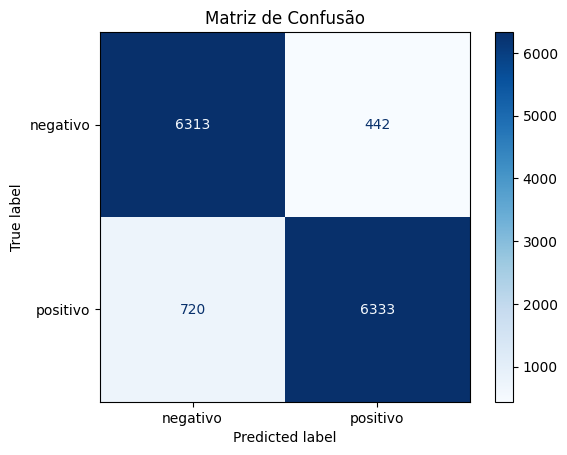

In [62]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculando a matriz de confusão
cm = confusion_matrix(y_test, y_pred, labels=modelo_final_bruto.classes_)

# Visualizando
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=modelo_final_bruto.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.show()


In [64]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer

# 1. Criar vetorizador e aplicar no texto tratado (campo 'tratamento_5')
tfidf = TfidfVectorizer(lowercase=False)
X_tfidf_tratado = tfidf.fit_transform(df_cleaned['tratamento_5'])

# 2. Variável alvo
y = df_cleaned['sentimento']

# 3. Dividir treino e teste com stratify para manter proporção das classes
x_treino, x_teste, y_treino, y_teste = train_test_split(
    X_tfidf_tratado, y, test_size=0.2, random_state=42, stratify=y)

# 4. Criar e treinar modelo (apenas uma vez, com treino)
modelo_final_tratado = LogisticRegression(max_iter=1000, penalty='l2', C=1.0, class_weight='balanced')
modelo_final_tratado.fit(x_treino, y_treino)

# 5. Avaliar no teste
acuracia_tfidf_tratado = modelo_final_tratado.score(x_teste, y_teste)
print(f'Acurácia: {acuracia_tfidf_tratado * 100:.2f}%')

Acurácia: 90.20%


Uma vez definido que o modelo que melhor atuou foi o com as avaliações brutas, salvamos este modelo para replicabilidade.

In [65]:
import joblib

# Salvando o modelo treinado
joblib.dump(modelo_final_bruto, 'modelo_final_regressao_logistica.pkl')

# Salvando o vetor TF-IDF ajustado
joblib.dump(vetorizer, 'vetorizador_tfidf_final.pkl')

['vetorizador_tfidf_final.pkl']

### Importando o modelo e testando sua usabilidade

In [66]:
modelo = joblib.load('modelo_final_regressao_logistica.pkl')
vetorizador = joblib.load('vetorizador_tfidf_final.pkl')

# Exemplo: transformar novo texto e predizer
novas_avaliacoes = [
    "Produto excelente, superou todas as minhas expectativas!",
    "A entrega demorou além do prazo, fiquei insatisfeito.",
    "Material de ótima qualidade, bem resistente.",
    "O produto veio com arranhões, parecia usado.",
    "Fácil de montar, manual bem explicado.",
    "Não recomendo, produto frágil e mal acabado.",
    "A loja foi super atenciosa, tirou todas as minhas dúvidas.",
    "O tamanho não corresponde ao informado no site, me decepcionei.",
    "Design moderno e muito bonito, adorei!",
    "Veio com peça faltando, tive que entrar em contato para reposição.",
    "Custo-benefício excelente, valeu muito a pena!",
    "Produto barulhento, incomoda durante o uso.",
    "Chegou antes do prazo, muito bem embalado.",
    "O desempenho é abaixo do esperado, não recomendo.",
    "Comprei para presentear e a pessoa adorou, ótimo produto.",
    "Infelizmente, o produto apresentou defeito logo na primeira semana.",
    "Muito confortável, ótimo para uso diário.",
    "A embalagem veio rasgada e o produto com pequenos danos.",
    "Atendeu perfeitamente minhas necessidades, super feliz com a compra.",
    "O atendimento ao cliente foi péssimo, demoraram dias para responder.",
    "Ótima qualidade, acabamento impecável.",
    "Produto com cheiro forte de plástico, desagradável.",
    "Funcionamento silencioso, ideal para o ambiente de trabalho.",
    "Não funcionou direito desde o primeiro uso, tive que devolver.",
    "Preço justo pela qualidade entregue, recomendo.",
    "A descrição do produto não condiz com o que recebi.",
    "Produto leve e fácil de transportar, muito prático.",
    "Achei o material muito frágil, não parece durável.",
    "A loja enviou rápido e a entrega foi feita antes do previsto.",
    "O produto esquenta demais, fiquei preocupado com a segurança.",
    "Super fácil de usar, mesmo para quem não tem experiência.",
    "A montagem foi um pesadelo, faltaram instruções claras.",
    "Ótima durabilidade, estou usando há meses sem problemas.",
    "Produto mal acabado, com rebarbas de plástico.",
    "Design bonito e funcional, gostei bastante.",
    "Não recomendo, veio com defeito de fábrica.",
    "Muito útil no dia a dia, atende bem às expectativas.",
    "A cor veio totalmente diferente da que escolhi, fiquei frustrado.",
    "Excelente atendimento, resolveram meu problema rapidamente.",
    "Produto veio sujo e com marcas de uso, parece devolução de outro cliente.",
    "Qualidade acima da média, fiquei surpreso positivamente.",
    "O tamanho é menor do que o anunciado, fiquei decepcionado.",
    "Bateria com ótima duração, superou minhas expectativas.",
    "O produto não liga, tive que pedir a troca.",
    "Fácil de limpar, muito prático.",
    "A loja demorou para postar o produto, fiquei dias sem atualização de rastreio.",
    "Produto com acabamento premium, muito satisfeito.",
    "Achei o preço alto pelo que oferece, não compraria novamente.",
    "Entrega super rápida e embalagem impecável.",
    "Não gostei, veio com peças quebradas.",
    "Atende perfeitamente, ótimo custo-benefício.",
    "Produto com desempenho fraco, não recomendo.",
    "Muito leve e fácil de manusear, adorei.",
    "Veio mal embalado, quase danificou no transporte.",
    "Produto exatamente como descrito, sem surpresas.",
    "Não gostei do funcionamento, é muito lento.",
    "Ótimo para quem procura praticidade e eficiência.",
    "Chegou com atraso e sem aviso prévio.",
    "Produto super funcional, uso todos os dias.",
    "Comprei e me arrependi, qualidade bem baixa.",
    "Manual claro, facilitou bastante o uso inicial.",
    "Produto não atendeu minhas expectativas, esperava mais.",
    "Surpreendentemente bom, pelo preço que paguei.",
    "Atendimento excelente, me ajudaram durante toda a compra.",
    "Veio com defeito no botão de ligar, precisei acionar a garantia."
]

X_novo = vetorizador.transform(novas_avaliacoes)
predicao = modelo.predict(X_novo)
print(predicao)

['positivo' 'positivo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'positivo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'negativo' 'positivo' 'negativo'
 'positivo' 'negativo' 'positivo' 'positivo' 'positivo' 'negativo'
 'positivo' 'positivo' 'positivo' 'positivo' 'negativo']


In [67]:
df_previsoes = pd.DataFrame({
    'avaliacao': novas_avaliacoes,
    'sentimento_predito': predicao
})

df_previsoes['sentimento_predito'].value_counts()

sentimento_predito
positivo    37
negativo    28
Name: count, dtype: int64

In [68]:
df_previsoes.head(30)

,avaliacao,sentimento_predito
0,"Produto excelente, superou todas as minhas exp...",positivo
1,"A entrega demorou além do prazo, fiquei insati...",positivo
2,"Material de ótima qualidade, bem resistente.",positivo
3,"O produto veio com arranhões, parecia usado.",negativo
4,"Fácil de montar, manual bem explicado.",positivo
5,"Não recomendo, produto frágil e mal acabado.",negativo
6,"A loja foi super atenciosa, tirou todas as min...",positivo
7,O tamanho não corresponde ao informado no site...,negativo
8,"Design moderno e muito bonito, adorei!",positivo
9,"Veio com peça faltando, tive que entrar em con...",negativo
